##### Copyright 2019 The TensorFlow Authors.

Licensed under the Apache License, Version 2.0 (the "License");

In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# pix2pix: Image-to-image translation with a conditional GAN

### Informations about Pix2Pix

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/generative/pix2pix"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/pix2pix.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/pix2pix.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/generative/pix2pix.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

This tutorial demonstrates how to build and train a conditional generative adversarial network (cGAN) called pix2pix that learns a mapping from input images to output images, as described in [Image-to-image translation with conditional adversarial networks](https://arxiv.org/abs/1611.07004){:.external} by Isola et al. (2017). pix2pix is not application specific—it can be applied to a wide range of tasks, including synthesizing photos from label maps, generating colorized photos from black and white images, turning Google Maps photos into aerial images, and even transforming sketches into photos.

In this example, your network will generate images of building facades using the [CMP Facade Database](http://cmp.felk.cvut.cz/~tylecr1/facade/) provided by the [Center for Machine Perception](http://cmp.felk.cvut.cz/){:.external} at the [Czech Technical University in Prague](https://www.cvut.cz/){:.external}. To keep it short, you will use a [preprocessed copy](https://efrosgans.eecs.berkeley.edu/pix2pix/datasets/){:.external} of this dataset created by the pix2pix authors.

In the pix2pix cGAN, you condition on input images and generate corresponding output images. cGANs were first proposed in [Conditional Generative Adversarial Nets](https://arxiv.org/abs/1411.1784) (Mirza and Osindero, 2014)

The architecture of your network will contain:

- A generator with a [U-Net](https://arxiv.org/abs/1505.04597){:.external}-based architecture.
- A discriminator represented by a convolutional PatchGAN classifier (proposed in the [pix2pix paper](https://arxiv.org/abs/1611.07004){:.external}).



Pix2Pix GAN **Working Principle** :
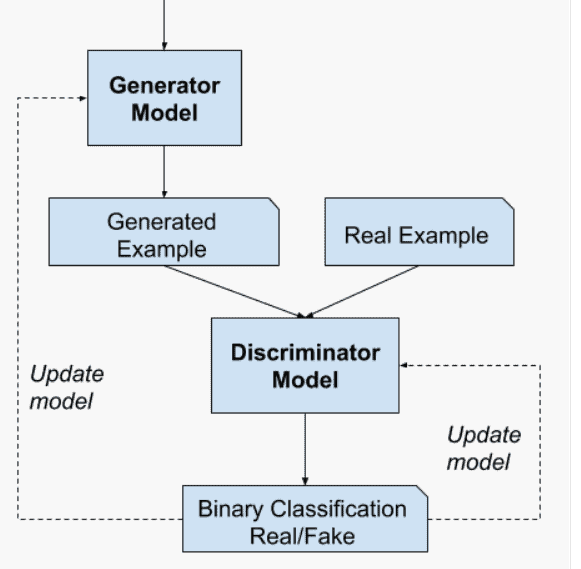

## Import TensorFlow and other libraries

In [1]:
import tensorflow as tf

import time
import gc
import os
import io
import glob
import base64
import PIL
from PIL import Image
from functools import reduce
import pathlib
import time
import datetime
import cv2
import numpy as np

from matplotlib import pyplot as plt
from IPython import display

## Loading the datasets

YOU CAN FIND the shared files here (put this shared folder into your "My drive" directory in google drive):
 https://drive.google.com/drive/folders/19M08ITTCRv6AHOMG6eogdmJWtK5i4vYy?usp=sharing

If the files are no longer available or subject to sharing restrictions, you can find the files and info into the project github folder.

In [2]:
# Mount drive
from google.colab import drive
drive.mount('/content/drive')



Mounted at /content/drive


### Loading functions and datset management

In [3]:
# Each image is 512x512 in size
IMG_WIDTH = 512
IMG_HEIGHT = 512
UPSCALE_SIZE = 572
BATCH_SIZE = 1

As described in the [pix2pix paper](https://arxiv.org/abs/1611.07004){:.external}, you need to apply random jittering and mirroring to preprocess the training set.

Define several functions that:

1. Resize each `IMG_WIDTH x IMG_HEIGHT` image to a larger height and width—`UPSCALE_SIZE x UPSCALE_SIZE`.
2. Randomly crop it back to `IMG_WIDTH x IMG_HEIGHT`.
3. Randomly flip the image horizontally i.e. left to right (random mirroring).
4. Normalize the images to the `[0, 1]` range. [[0,1] due to binary img processing]

In [4]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

def random_crop(input_image, real_image):

  stacked_image = tf.concat([input_image, real_image], axis=2)
  last_real_dim = tf.shape(real_image)[-1]
  last_input_dim = tf.shape(input_image)[-1]
  size = [IMG_HEIGHT, IMG_WIDTH]
  cropped_image = tf.image.random_crop(
      stacked_image, size=tf.concat([size, [last_real_dim + last_input_dim]],
                     axis=0))

  return (cropped_image[:, :, :last_input_dim],
          cropped_image[:, :, last_input_dim:])

@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to upscale size
  input_image, real_image = resize(input_image, real_image, UPSCALE_SIZE, UPSCALE_SIZE)

  # Random cropping back to oringal height and width
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

In [5]:
def parse_tfrecord_fn(example_proto):
    feature_description = {
        'image1': tf.io.FixedLenFeature([], tf.string),
        'image2': tf.io.FixedLenFeature([], tf.string),
    }
    example = tf.io.parse_single_example(example_proto, feature_description)

    # Decode the JPEG images
    image1 = tf.io.decode_jpeg(example['image1'], channels=3)  # Assuming rgb images
    image2 = tf.io.decode_jpeg(example['image2'], channels=1)  # Assuming grayscale images

    # Normalize the images if needed
    image1 = tf.cast(image1, tf.float32) / 255.0
    image2 = tf.cast(image2, tf.float32) / 255.0

    # Expand the dimensions
    image1 = tf.expand_dims(image1, axis=0)
    image2 = tf.expand_dims(image2, axis=0)

    return image1, image2
def parse_tfrecord_fn_train(example_proto):
    feature_description = {
        'image1': tf.io.FixedLenFeature([], tf.string),
        'image2': tf.io.FixedLenFeature([], tf.string),
    }
    example = tf.io.parse_single_example(example_proto, feature_description)

    # Decode the JPEG images
    image1 = tf.io.decode_jpeg(example['image1'], channels=3)  # Assuming rgb images
    image2 = tf.io.decode_jpeg(example['image2'], channels=1)  # Assuming grayscale images

    # Add some jittering to training images
    image1, image2 = random_jitter(image1, image2)

    # Normalize the images if needed
    image1 = tf.cast(image1, tf.float32) / 255.0
    image2 = tf.cast(image2, tf.float32) / 255.0

    # Expand the dimensions
    image1 = tf.expand_dims(image1, axis=0)
    image2 = tf.expand_dims(image2, axis=0)

    return image1, image2

def load_dataset_from_tfrecord(filename, type='std'):
    dataset = tf.data.TFRecordDataset(filename)
    if type == 'train':
      dataset = dataset.map(parse_tfrecord_fn_train, num_parallel_calls=tf.data.AUTOTUNE)
    elif type == 'std':
      dataset = dataset.map(parse_tfrecord_fn, num_parallel_calls=tf.data.AUTOTUNE)
    return dataset

In [6]:
# Check dataset info
def check_dataset_info(dataset, name_dataset, return_length=False):
  dataset_length = dataset.reduce(0, lambda x, _: x + 1) # to avoid long time due to iteration
  dataset_length = dataset_length.numpy()
  # Get image resolution
  for input, tar in dataset.take(1):
    image_h = input[0].shape[0]
    image_w = input[0].shape[1]
    image_resol = (image_h, image_w)
  # Get the element spec of the dataset
  element_spec = dataset.element_spec
  # Extract the shape information from the element spec
  batch_size = element_spec[0].shape[0]
  print(f'\033[1mDataset\033[0m:\033[4m{name_dataset}\033[0m | Size: {dataset_length}, Image resol.:{image_resol}, Batch_size: {batch_size}')
  print('____________________________________________________________________________________________________________')
  if return_length:
    return dataset_length

### Load the original dataset for cGAN
This dataset was created for the cGAN that proficiently segmented the burrs form the rgb soles of the image.

In [7]:
#512x512 images
# Simulation images datasets
cgan_train_dataset_sim = load_dataset_from_tfrecord('drive/MyDrive/Colab_Notebooks/datasets/cgan/sim/cgan_train_dataset_sim.tfrecord', type='train') # 20000 (rgb sole images, ground-truth binary burr images), batch_size=1
cgan_val_dataset_sim = load_dataset_from_tfrecord('drive/MyDrive/Colab_Notebooks/datasets/cgan/sim/cgan_val_dataset_sim.tfrecord') # 500 (rgb sole images, ground-truth binary burr images), batch_size=1
cgan_test_dataset_sim = load_dataset_from_tfrecord('drive/MyDrive/Colab_Notebooks/datasets/cgan/sim/cgan_test_dataset_sim.tfrecord') # 40 (rgb sole images, ground-truth binary burr images), batch_size=1
cgan_test_dataset_sim_from_gazebo = load_dataset_from_tfrecord('drive/MyDrive/Colab_Notebooks/datasets/cgan/sim/cgan_test_dataset_sim_from_gazebo.tfrecord') # 50 (rgb sole images, ground-truth binary burr images), batch_size=1, taken directly from gazebo camera

# Real images datasets
cgan_train_dataset_real = load_dataset_from_tfrecord('drive/MyDrive/Colab_Notebooks/datasets/cgan/real/cgan_train_dataset_real.tfrecord', type='train') # 500 (rgb sole images, ground-truth binary burr images), batch_size=1
cgan_test_dataset_real = load_dataset_from_tfrecord('drive/MyDrive/Colab_Notebooks/datasets/cgan/real/cgan_test_dataset_real.tfrecord') # 46 (rgb sole images, ground-truth binary burr images), batch_size=1


In [8]:
# Check loaded cgan datasets info
check_dataset_info(cgan_train_dataset_sim, 'Training sim dataset for CGAN (cgan_train_dataset_sim)')
check_dataset_info(cgan_val_dataset_sim, 'Validation sim dataset for CGAN (cgan_val_dataset_sim)')
check_dataset_info(cgan_test_dataset_sim, 'Test sim dataset for CGAN (cgan_test_dataset_sim)')
check_dataset_info(cgan_test_dataset_sim_from_gazebo, 'Test sim from gazebo dataset for CGAN (cgan_test_dataset_sim_from_gazebo)')

check_dataset_info(cgan_train_dataset_real, 'Training real dataset for CGAN (cgan_train_dataset_real)')
check_dataset_info(cgan_test_dataset_real, 'Test real dataset for CGAN (cgan_test_dataset_real)')

Dataset:Training sim dataset for CGAN (cgan_train_dataset_sim) | Size: 20000, Image resol.:(512, 512), Batch_size: 1
____________________________________________________________________________________________________________
Dataset:Validation sim dataset for CGAN (cgan_val_dataset_sim) | Size: 500, Image resol.:(512, 512), Batch_size: 1
____________________________________________________________________________________________________________
Dataset:Test sim dataset for CGAN (cgan_test_dataset_sim) | Size: 40, Image resol.:(512, 512), Batch_size: 1
____________________________________________________________________________________________________________
Dataset:Test sim from gazebo dataset for CGAN (cgan_test_dataset_sim_from_gazebo) | Size: 50, Image resol.:(512, 512), Batch_size: 1
____________________________________________________________________________________________________________
Dataset:Training real dataset for CGAN (cgan_train_dataset_real) | Size: 500, Image resol.

Input_shape (1, 512, 512, 3)
Gt shape (1, 512, 512, 1)


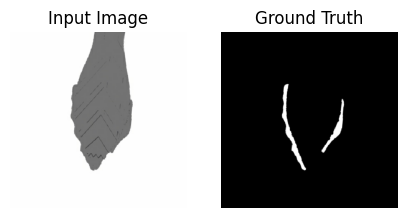

Input_shape (1, 512, 512, 3)
Gt shape (1, 512, 512, 1)


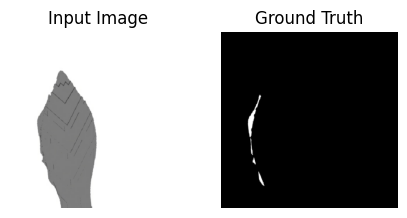

Input_shape (1, 512, 512, 3)
Gt shape (1, 512, 512, 1)


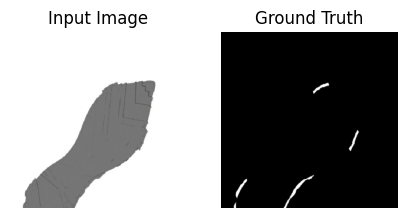

Input_shape (1, 512, 512, 3)
Gt shape (1, 512, 512, 1)


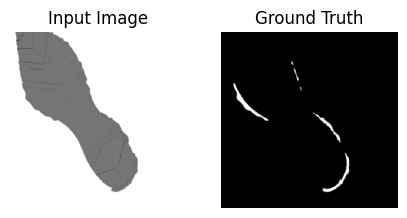

Input_shape (1, 512, 512, 3)
Gt shape (1, 512, 512, 1)


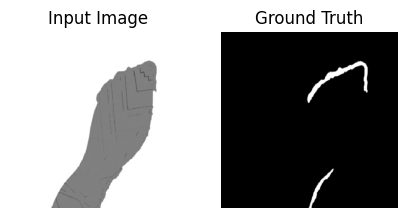

In [10]:
for test_input, tar in cgan_train_dataset_sim.take(5):
  plt.figure(figsize=(5,5))
  print('Input_shape', test_input.shape)
  print('Gt shape',tar.shape)
  display_list = [test_input[0], tar[0]]

  title = ['Input Image', 'Ground Truth']
  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    if i>0:
      plt.imshow(display_list[i], cmap='gray')
    else:
      plt.imshow(display_list[i] )
    plt.axis('off')
  plt.show()

## Select soles' image type (Simulation or Real)


*   SIM: Artificially created simulation images
*   REAL: Real images of the soles




In [42]:
IMG_TYPE = "SIM" #"REAL"

In [43]:
if IMG_TYPE == "SIM":
  train_dataset = cgan_train_dataset_sim
  test_dataset = cgan_test_dataset_sim
elif IMG_TYPE == "REAL":
  train_dataset = cgan_train_dataset_real
  test_dataset = cgan_test_dataset_real


# For other tests(simulation gazebo images)
test_2_dataset = cgan_test_dataset_sim_from_gazebo


## Build the generator

The generator of your pix2pix cGAN is a _modified_ [U-Net](https://arxiv.org/abs/1505.04597){:.external}. A U-Net consists of an encoder (downsampler) and decoder (upsampler). (You can find out more about it in the [Image segmentation](../images/segmentation.ipynb) tutorial and on the [U-Net project website](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/){:.external}.)

- Each block in the encoder is: Convolution -> Batch normalization -> Leaky ReLU
- Each block in the decoder is: Transposed convolution -> Batch normalization -> Dropout (applied to the first 3 blocks) -> ReLU
- There are skip connections between the encoder and decoder (as in the U-Net).

Define the downsampler (encoder):

In [44]:
INPUT_CHANNELS = 3
OUTPUT_CHANNELS = 1

In [45]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

Define the upsampler (decoder):

In [46]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

Define the generator with the downsampler and the upsampler:

In [47]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[IMG_HEIGHT,IMG_WIDTH, INPUT_CHANNELS]) # (batch_size, 512, 512, 3)

  down_stack = [
    downsample(32, 4, apply_batchnorm=False),  # (batch_size, 256, 256, 32)
    downsample(64, 4),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
    upsample(32, 4),  # (batch_size, 256, 256, 64)
 ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 512, 512, 1)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

Visualize the generator model architecture:

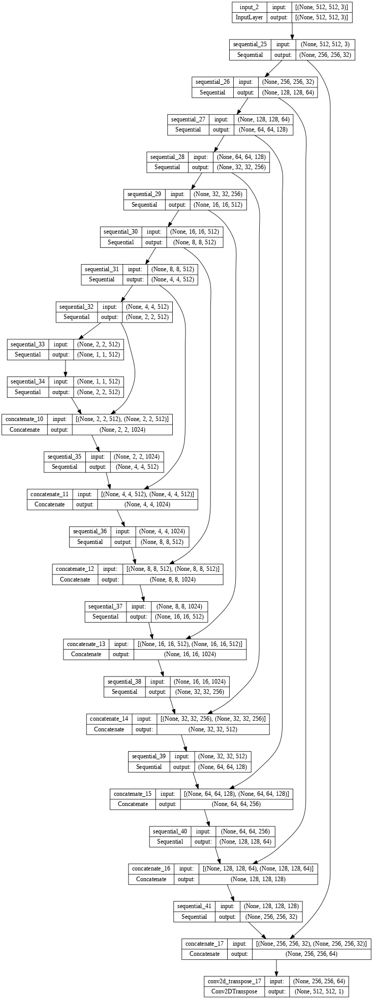

In [48]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

### Define the generator loss

GANs learn a loss that adapts to the data, while cGANs learn a structured loss that penalizes a possible structure that differs from the network output and the target image, as described in the [pix2pix paper](https://arxiv.org/abs/1611.07004){:.external}.

- The generator loss is a sigmoid cross-entropy loss of the generated images and an **array of ones**.
- The pix2pix paper also mentions the L1 loss, which is a MAE (mean absolute error) between the generated image and the target image. [here loss changed to BinaryFocalCrossentropy which was found more suitable for binary images]
- This allows the generated image to become structurally similar to the target image.
- The formula to calculate the total generator loss is `gan_loss + LAMBDA * l1_loss`, where `LAMBDA = 100`. This value was decided by the authors of the paper.

In [49]:
LAMBDA = 500

In [50]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)


In [51]:
def generator_loss(disc_generated_output, gen_output, target):
  # disc_generated_output = probability assigned to the generated image by the discriminator. Given a "perfect" generator which always has photorealistic outputs, the D(G(Z)) values should always be close to 1.
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss_object = tf.keras.losses.BinaryFocalCrossentropy(gamma=0.5, from_logits=True) # equal to binary crossentropy for gamma=0
  l1_loss = l1_loss_object(target,gen_output) #tf.reduce_mean(tf.abs(target - gen_output))


  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

The training procedure for the generator is as follows:

![Generator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/gen.png?raw=1)


## Build the discriminator

The discriminator in the pix2pix cGAN is a convolutional PatchGAN classifier—it tries to classify if each image _patch_ is real or not real, as described in the [pix2pix paper](https://arxiv.org/abs/1611.07004){:.external}.

- Each block in the discriminator is: Convolution -> Batch normalization -> Leaky ReLU.
- The shape of the output after the last layer is `(batch_size, 30, 30, 1)`.
- Each `30 x 30` image patch of the output classifies a `70 x 70` portion of the input image.
- The discriminator receives 2 inputs:
    - The input image and the target image, which it should classify as real.
    - The input image and the generated image (the output of the generator), which it should classify as fake.
    - Use `tf.concat([inp, tar], axis=-1)` to concatenate these 2 inputs together.

Let's define the discriminator:

In [52]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[IMG_HEIGHT,IMG_WIDTH, INPUT_CHANNELS], name='input_image')
  tar = tf.keras.layers.Input(shape=[IMG_HEIGHT,IMG_WIDTH, OUTPUT_CHANNELS], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 512, 512, INPUT_CHANNELS+OUTPUT_CHANNELS)

  down0 = downsample(IMG_WIDTH//8, 4, False)(x)  # (batch_size, 256, 256, 64)
  down1 = downsample(IMG_WIDTH//4, 4)(down0)  # (batch_size, 128, 128, 128)
  down2 = downsample(IMG_WIDTH//2, 4)(down1)  # (batch_size, 64, 64, 256)
  down3 = downsample(IMG_WIDTH, 4)(down2)  # (batch_size, 32, 32, 512)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 512)
  conv = tf.keras.layers.Conv2D(IMG_WIDTH*2, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 1024)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)   # (batch_size, 33, 33, 1024)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

Visualize the discriminator model architecture:

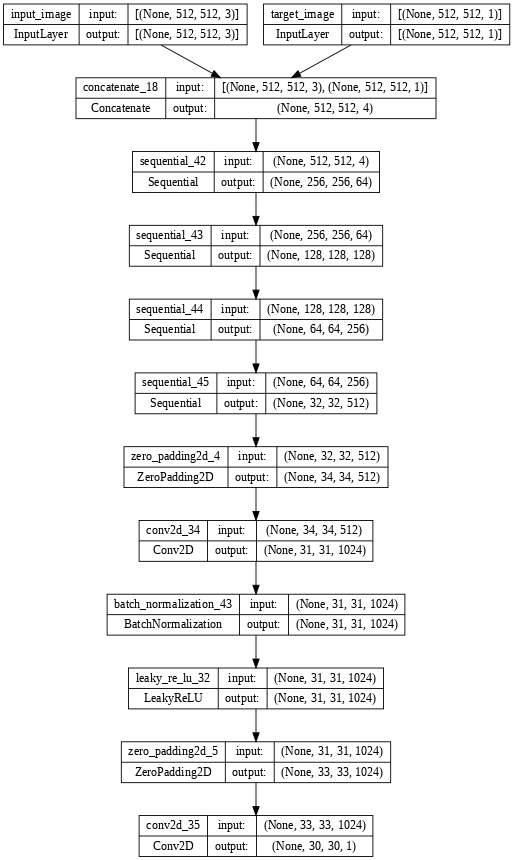

In [53]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

### Define the discriminator loss

- The `discriminator_loss` function takes 2 inputs: **real images** and **generated images**.
- `real_loss` is a sigmoid cross-entropy loss of the **real images** and an **array of ones(since these are the real images)**.
- `generated_loss` is a sigmoid cross-entropy loss of the **generated images** and an **array of zeros (since these are the fake images)**.
- The `total_loss` is the sum of `real_loss` and `generated_loss`.

In [54]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

The training procedure for the discriminator is shown below.

To learn more about the architecture and the hyperparameters you can refer to the [pix2pix paper](https://arxiv.org/abs/1611.07004){:.external}.

![Discriminator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/dis.png?raw=1)


## Define the optimizers and a checkpoint-saver


In [55]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [56]:
checkpoint_dir = 'drive/MyDrive/Colab_Notebooks/v8/checkpoints_gan_20k'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Generate images

Write a function to plot some images during training.

- Pass images from the test set to the generator.
- The generator will then translate the input image into the output.
- The last step is to plot the predictions and _voila_!

Note: The `training=True` is intentional here since you want the batch statistics, while running the model on the test dataset. If you use `training=False`, you get the accumulated statistics learned from the training dataset (which you don't want).

In [57]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = [IMG_TYPE+' Input Image', IMG_TYPE+' Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    if i>0:
      plt.imshow(display_list[i], cmap='gray')
    else:
      plt.imshow(display_list[i] )
    plt.axis('off')
  plt.show()

def generate_images_2(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(10, 10))

  display_list = [test_input[0], prediction[0]]
  title = ['Gazebo Sim. Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    if i>0:
      plt.imshow(display_list[i], cmap='gray')
    else:
      plt.imshow(display_list[i] )
    plt.axis('off')
  plt.show()

def composite_gen_images(generator,dataset_test,dataset_sim):

  inp_1, tar_1 = next(iter(dataset_test.take(1)))
  generate_images(generator, inp_1, tar_1)
  inp_2, tar_2 = next(iter(dataset_sim.take(1)))
  generate_images_2(generator, inp_2, tar_2)


Test the function:

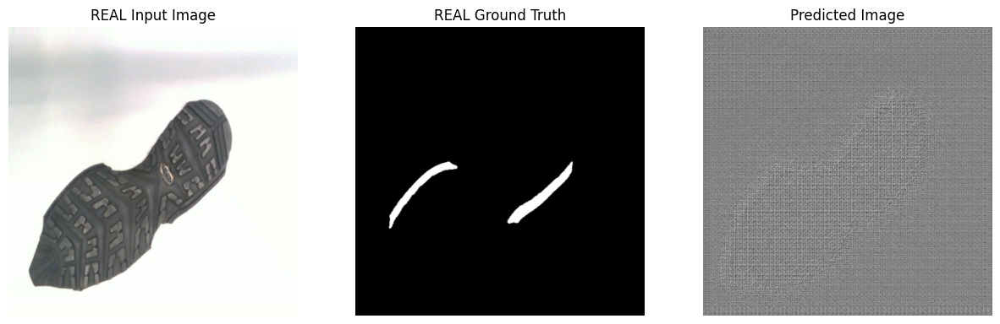

In [58]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)



## Training

- For each example input generates an output.
- The discriminator receives the `input_image` and the generated image as the first input. The second input is the `input_image` and the `target_image`.
- Next, calculate the generator and the discriminator loss.
- Then, calculate the gradients of loss with respect to both the generator and the discriminator variables(inputs) and apply those to the optimizer.
- Finally, log the losses to TensorBoard.

In [59]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [60]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)
    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

The actual training loop. Since this tutorial can run of more than one dataset, and the datasets vary greatly in size the training loop is setup to work in steps instead of epochs.

- Iterates over the number of steps.
- Every 10 steps print a dot (`.`).
- Every 1k steps: clear the display and run `generate_images` to show the progress.
- Every 5k steps: save a checkpoint.

In [61]:
def fit(train_ds, dataset_test, dataset_sim, steps, phase, epochs):
  example_input, example_target = next(iter(dataset_test.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      composite_gen_images(generator,dataset_test,dataset_sim)
      print(f"[Epochs-interval: {phase*steps//1000}/{epochs//1000}k]__Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)



This training loop saves logs that you can view in TensorBoard to monitor the training progress.

If you work on a local machine, you would launch a separate TensorBoard process. When working in a notebook, launch the viewer before starting the training to monitor with TensorBoard.

Launch the TensorBoard viewer (Sorry, this doesn't
display on tensorflow.org):

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

You can view the [results of a previous run](https://tensorboard.dev/experiment/lZ0C6FONROaUMfjYkVyJqw) of this notebook on [TensorBoard.dev](https://tensorboard.dev/).

Finally, run the training loop:

In [ ]:
EPOCHS = 100000
STEPS = 20000 #(number of train img, to save partial results every epochs/steps put save in the for loop)

for i in range(EPOCHS//STEPS):

   fit(train_dataset, test_dataset, test_2_dataset, steps=STEPS, phase=i+1, epochs=EPOCHS)
   # Save results
   checkpoint.save(file_prefix=checkpoint_prefix)






Interpreting the logs is more subtle when training a GAN (or a cGAN like pix2pix) compared to a simple classification or regression model. Things to look for:

- Check that neither the generator nor the discriminator model has "won". If either the `gen_gan_loss` or the `disc_loss` gets very low, it's an indicator that this model is dominating the other, and you are not successfully training the combined model.
- The value `log(2) = 0.69` is a good reference point for these losses, as it indicates a perplexity of 2 - the discriminator is, on average, equally uncertain about the two options.
- For the `disc_loss`, a value below `0.69` means the discriminator is doing better than random on the combined set of real and generated images.
- For the `gen_gan_loss`, a value below `0.69` means the generator is doing better than random at fooling the discriminator.
- As training progresses, the `gen_l1_loss` should go down.

## Restore the latest checkpoint and test the network

## Generate some images using the test set

cGAN trained on artificial sim images (few-shot or direct if specified)

In [41]:
# Restoring the latest checkpoint in checkpoint_dir
if IMG_TYPE == "SIM":
  checkpoint.restore(tf.train.latest_checkpoint('drive/MyDrive/Colab_Notebooks/v8/checkpoints_gan_20k/512x512_gamma0.5_lambda500_120k_it_best_on_sim/'))
  # Run the trained model on a few examples from the test set
  for inp, tar in test_dataset:
    generate_images(generator, inp, tar)
  #Run on other test images from gazebo simulation
  for inp, tar in test_2_dataset:
    generate_images_2(generator, inp, tar)


Output hidden; open in https://colab.research.google.com to view.

cGAN trained on real images (few-shot or direct if specified)

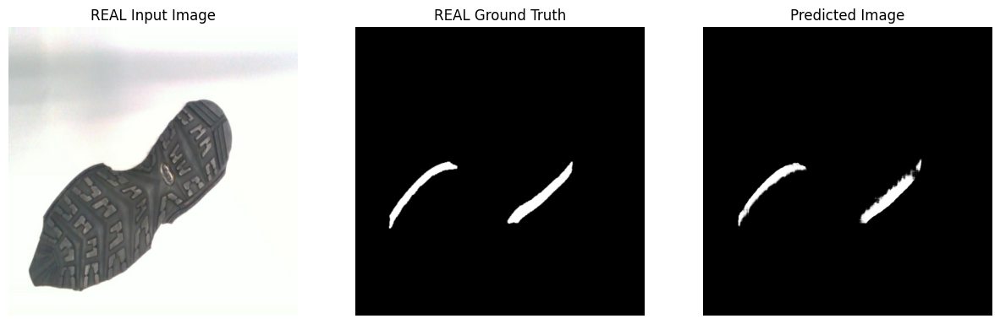

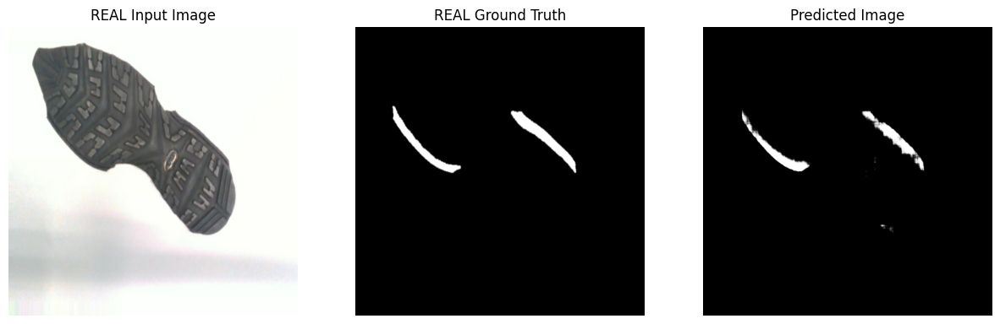

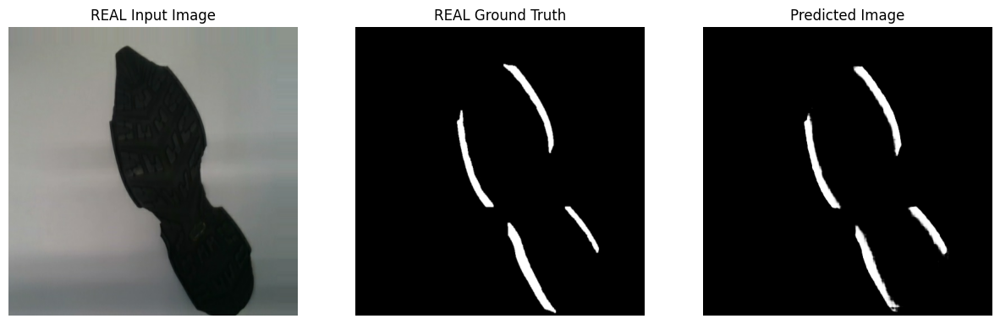

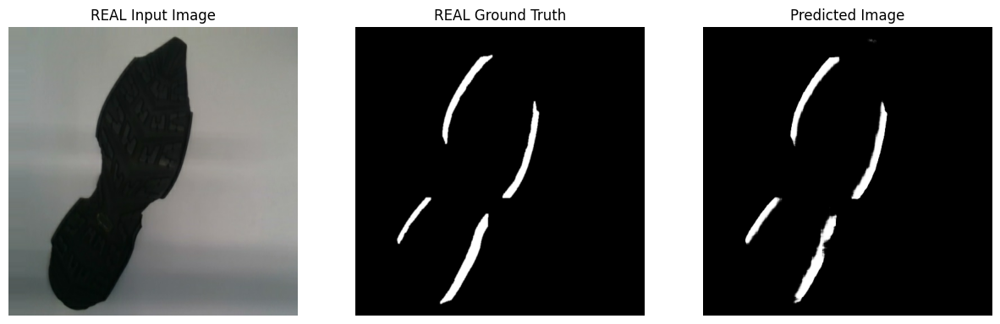

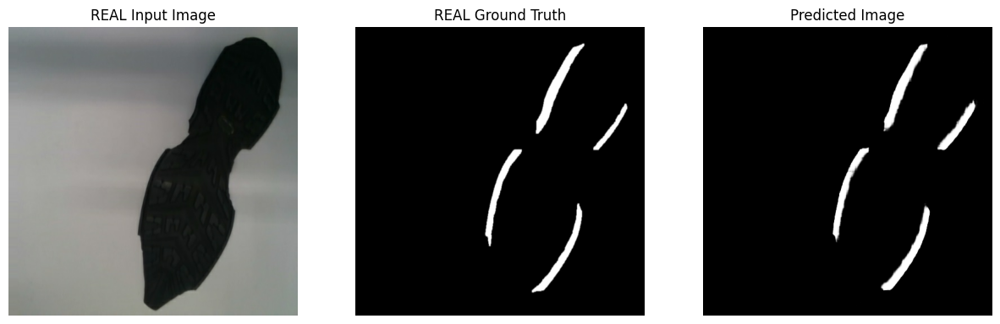

...

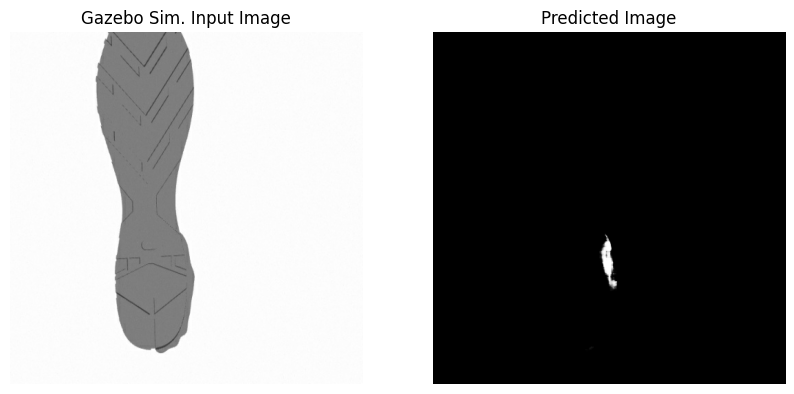

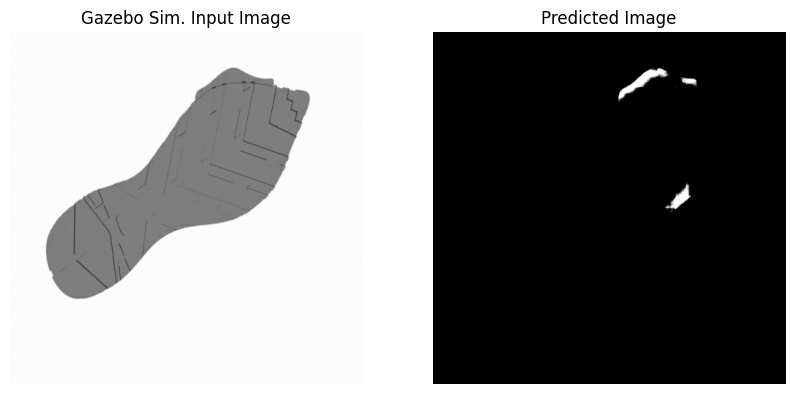

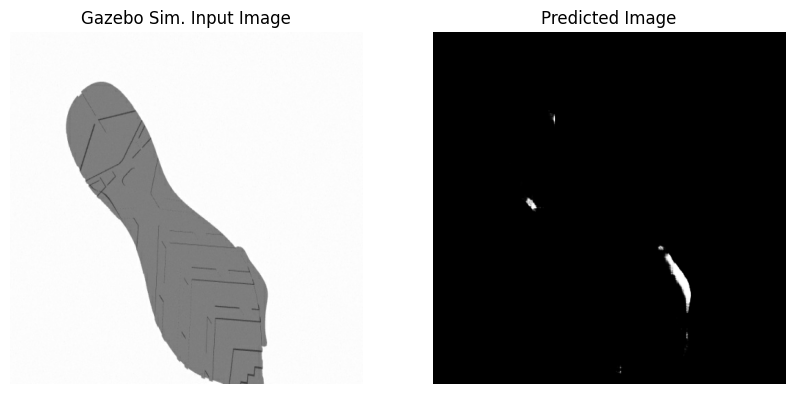

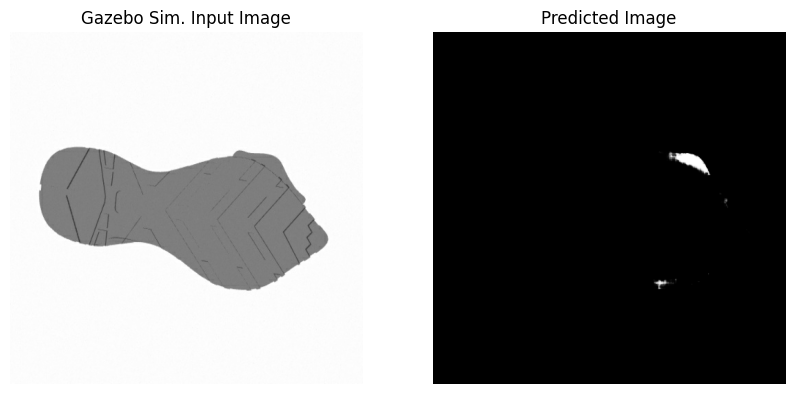

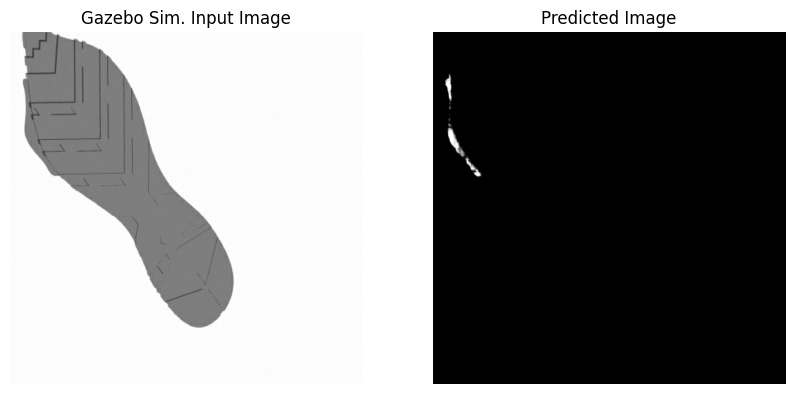

In [64]:
if IMG_TYPE == "REAL":
  checkpoint.restore(tf.train.latest_checkpoint('drive/MyDrive/Colab_Notebooks/v8/checkpoints_gan_20k/phase2-real_500real_ds-4000epochs_steps500/')) # FEW-SHOT (BETTER)
  #checkpoint.restore(tf.train.latest_checkpoint('drive/MyDrive/Colab_Notebooks/v8/just_real_gan_ep40000_step500/')) # FEW-SHOT (BETTER)

  # Run the trained model on a few examples from the test set
  for inp, tar in test_dataset:
    generate_images(generator, inp, tar)
  #Run on other test images from gazebo simulation
  for inp, tar in test_2_dataset:
    generate_images_2(generator, inp, tar)